# Fashion Image Attribute Classification

## Importing Libraries and Packages

In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import datetime

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
import cv2
from google.colab.patches import cv2_imshow

import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Add, Dropout, Flatten, Conv2D, MaxPool2D
from tensorflow.keras.activations import softmax, sigmoid
from tensorflow.keras import regularizers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import categorical_crossentropy, binary_crossentropy
from tensorflow.keras.metrics import categorical_accuracy, top_k_categorical_accuracy
from tensorflow.keras.callbacks import ModelCheckpoint, TensorBoard, EarlyStopping
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


## Loading and Analysing the Dataset

In [ ]:
#unzipping the images
!unzip '/content/drive/MyDrive/imgs.zip'

In [4]:
products = pd.read_csv('products.csv')
#printing some of the rows of dataframe
print(f"Total images in dataset = {products.shape[0]}")
products.head(10)

Total images in dataset = 7873


,path,category,attribute_1,attribute_2
0,imgs/men/0.jpg,Sweatshirts,"black, grey",Regular
1,imgs/men/1.jpg,Jackets,NaN,Regular
2,imgs/men/2.jpg,Track Pants,NaN,Regular
3,imgs/men/3.jpg,Jackets,black,Regular
4,imgs/men/4.jpg,Jackets,NaN,Regular
5,imgs/men/5.jpg,Jackets,black,Regular
6,imgs/men/6.jpg,Jackets,black,Regular
7,imgs/men/7.jpg,Tshirts,blue,Regular
8,imgs/men/8.jpg,Jackets,black,Regular
9,imgs/men/9.jpg,Jackets,"blue, navy",Regular


We will divide the dataset in such a way that the test set consists of images whose attributes are missing.

## Dataset Preparation

In [5]:
#taking the products which have NaN value of attribute as test set
x_test = products[products.isna().any(1)]
x_train = products.dropna()

In [6]:
#shuffling the train and test datasets
x_train = x_train.sample(frac = 1).reset_index(drop = True)
x_test = x_test.sample(frac = 1).reset_index(drop = True)

print(f"Shape of train dataset = {x_train.shape}")
print(f"Shape of test dataset = {x_test.shape}")

Shape of train dataset = (5634, 4)
Shape of test dataset = (2239, 4)


Thus, we have 5.6k images for training and 2.2 images for test set.

### Cleaning the Labels

In [7]:
#performing some cleaning on the labels
#replacing the commas in the attribute_1 feature and stripping of blank spaces
x_train.attribute_1 = x_train.attribute_1.apply(lambda x: x.replace(',', '').strip().lower())
#making multiple letter words in category and attribute_2 as single words
x_train.category = x_train.category.apply(lambda x: x.replace(' ', '_').lower())
x_train.attribute_2 = x_train.attribute_2.apply(lambda x: x.replace(' ', '_').replace('-', '_').lower())

### One-hot encoding of labels

In [8]:
#we will now encode the labels in a one-hot format
count_vect = CountVectorizer(binary = True)
x_train['attribute_1_ohe'] = count_vect.fit_transform(x_train.attribute_1).toarray().tolist()
attribute_1_labels = count_vect.get_feature_names()

x_train['attribute_2_ohe'] = count_vect.fit_transform(x_train.attribute_2).toarray().tolist()
attribute_2_labels = count_vect.get_feature_names()

x_train['category_ohe'] = count_vect.fit_transform(x_train.category).toarray().tolist()
category_labels = count_vect.get_feature_names()

In [9]:
#looking at the dataframe again now:
x_train.head(3)

,path,category,attribute_1,attribute_2,attribute_1_ohe,attribute_2_ohe,category_ohe
0,imgs/women/234.jpg,kurtas,navy blue white,calf_length,"[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, ..."
1,imgs/men/1046.jpg,trousers,grey,regular,"[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0]","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
2,imgs/women/4431.jpg,dresses,maroon,maxi,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0]","[0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


In [11]:
# splitting into train and validation
x_train, x_val = train_test_split(x_train, test_size = 0.2)

### ImageGenerator

In [23]:
train_gen = tf.keras.preprocessing.image.ImageDataGenerator(
            zca_whitening=False, zca_epsilon=1e-06, rotation_range=30, width_shift_range=0.3,
            height_shift_range=0.3, shear_range=0.2, zoom_range=0.2,
            channel_shift_range=0.15, fill_mode='nearest', cval=0.0,
            horizontal_flip=True, vertical_flip=False, 
            preprocessing_function= preprocess_input,
        )
val_gen = tf.keras.preprocessing.image.ImageDataGenerator(
            zca_whitening=False, zca_epsilon=1e-06, fill_mode='nearest', cval=0.0,
            vertical_flip=False, 
            preprocessing_function= preprocess_input,
        )
train_img = train_gen.flow_from_dataframe(
                            x_train, x_col='path', y_col=['category_ohe', 'attribute_1_ohe', 'attribute_2_ohe'],
                            # weight_col = 'weights',
                            target_size=(224, 224), color_mode='rgb',
                            class_mode='multi_output', batch_size=64, shuffle=True,
                            interpolation='nearest',
                            validate_filenames=True,
                        )
val_img = val_gen.flow_from_dataframe(
                            x_val, x_col='path', y_col=['category_ohe', 'attribute_1_ohe', 'attribute_2_ohe'],
                            # weight_col = 'weights',
                            target_size=(224, 224), color_mode='rgb',
                            class_mode='multi_output', batch_size=64, shuffle=True,
                            interpolation='nearest',
                            validate_filenames=True,
                        )

Found 4507 validated image filenames.
Found 1127 validated image filenames.


### Analysing the generator

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Showing sample images


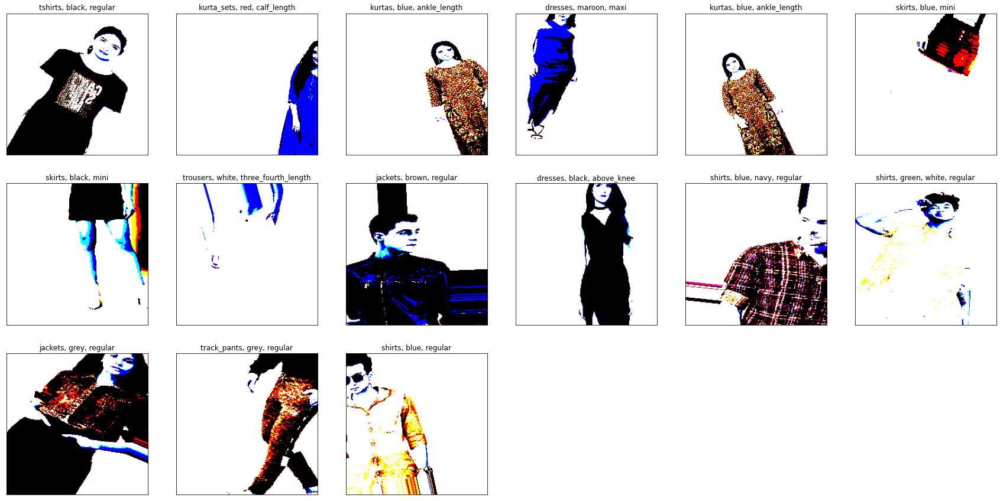

In [16]:
sample_batch = next(train_img)

def plot_img(image_array,number_of_images):
    plt.figure(figsize=(30,1*number_of_images))
    columns=6
    rows=np.ceil(number_of_images/columns)
    print("Showing sample images")
    for i in range(number_of_images):
        plt.subplot(rows,columns,i+1)
        plt.imshow(image_array[0][i])
        product_category = category_labels[image_array[1][0][i].argmax()]
        product_attribute_1 = ', '.join(np.array(attribute_1_labels)[np.where(image_array[1][1][i] == 1)[0]].tolist())
        product_attribute_2 = attribute_2_labels[image_array[1][2][i].argmax()]
        plt.title(product_category + ', ' + product_attribute_1 + ', ' + product_attribute_2)
        plt.xticks([])
        plt.yticks([])

    plt.show()

plot_img(sample_batch[:15],15)

## Modelling

### Defining Model Architecture

Using Pretrained ResNet-50 as an initial encoder model to extract features from the images. Using the extracted features for 3 kinds of predictions, i.e. Category predictions, Attribute_1 prediction and Attribute_2 prediction. 
We will also freeze the initial layers of the resnet architecture and train only the last few layers.

Since the attribute 2 somewhat inherits from category, so we will also add a direct connection from category to attribute 2.

In [17]:
tf.keras.backend.clear_session()
resnet_model = ResNet50(weights='imagenet', include_top = False, input_shape = (224,224,3))
for layer_number, layer in enumerate(resnet_model.layers):
    layer.trainable = False
    if layer_number == 150:
        break

#category Conv layers
cat = Conv2D(1024, (3,3), padding = 'same', activation = 'relu', kernel_regularizer = regularizers.l2(0.0005))(resnet_model.output)
cat = Conv2D(512, (3,3), padding = 'same', activation = 'relu', kernel_regularizer = regularizers.l2(0.0005))(cat)
cat = MaxPool2D((2,2))(cat)

#attribute_1 Conv layers
attr_1 = Conv2D(1024, (3,3), padding = 'same', activation = 'relu', kernel_regularizer = regularizers.l2(0.0005))(resnet_model.output)
attr_1 = Conv2D(512, (3,3), padding = 'same', kernel_regularizer = regularizers.l2(0.0005))(attr_1)
attr_1 = MaxPool2D((2,2))(attr_1)

#attribute_2 Conv layers
attr_2 = Conv2D(1024, (3,3), padding = 'same', activation = 'relu', kernel_regularizer = regularizers.l2(0.0005))(resnet_model.output)
attr_2 = Conv2D(512, (3,3), padding = 'same', activation = 'relu', kernel_regularizer = regularizers.l2(0.0005))(attr_2)
attr_2 = MaxPool2D((2,2))(attr_2)

cat = Flatten()(cat)
attr_1 = Flatten()(attr_1)
attr_2 = Flatten()(attr_2)

#category Dense layers
cat = Dense(units=512, activation='relu', kernel_regularizer=regularizers.l2(0.0005))(cat)
cat_attr = Dropout(0.3)(cat) #this layer will also go to the attribute_2 layer, as they are somewhat related
cat = Dense(units=256, activation='relu', kernel_regularizer=regularizers.l2(0.0005))(cat_attr)

#attribute_1 Dense layers
attr_1 = Dense(units=512, activation='relu', kernel_regularizer=regularizers.l2(0.0005))(attr_1)
attr_1 = Dropout(0.3)(attr_1)
attr_1 = Dense(units=256, activation='relu', kernel_regularizer=regularizers.l2(0.0005))(attr_1)

#attribute_2 Dense Layers
attr_2 = Dense(units=512, activation='relu', kernel_regularizer=regularizers.l2(0.0005))(attr_2)
attr_2 = Dropout(0.3)(attr_2)
#adding the connection from category layer
cat_attr_2 = Add()([cat_attr, attr_2])
attr_2 = Dense(units=256, activation='relu', kernel_regularizer=regularizers.l2(0.0005))(cat_attr_2)

#final outputs
#category is a multiclass classification, so using softmax activation
cat_out = Dense(units=18, activation='softmax', kernel_regularizer=regularizers.l2(0.0005), name="Category_output")(cat)
#attribute_1 is a multilabel classification, so using sigmoid activation
attr_1_out = Dense(units=29, activation='sigmoid', kernel_regularizer=regularizers.l2(0.0005), name="Attribute_1_output")(attr_1)
#attribute_2 is a multiclass classification, so using softmax activation
attr_2_out = Dense(units=15, activation='softmax', kernel_regularizer=regularizers.l2(0.0005), name="Attribute_2_output")(attr_2)

94773248/94765736 [==============================] - 1s 0us/step


In [18]:
model = Model(inputs=resnet_model.input, outputs=[cat_out, attr_1_out, attr_2_out])
opt = Adam(lr=0.001)

#We will use categorical crossentropy for multiclass classification and 
#binary crossentropy for multilabel classification
losses = {'Category_output':'categorical_crossentropy',
         'Attribute_1_output':'binary_crossentropy',
         'Attribute_2_output':'categorical_crossentropy'}
metrics = {"Category_output":'categorical_accuracy',
          "Attribute_1_output":"top_k_categorical_accuracy",
          "Attribute_2_output":"categorical_accuracy"}
model.compile(optimizer=opt, loss=losses, metrics=metrics)

### Visualizing the model architecture

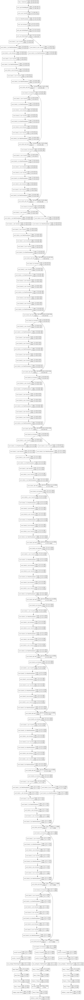

In [19]:
tf.keras.utils.plot_model(model, show_shapes = True)

In [20]:
model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
_______________________________________________________________________________________

### Callbacks assigning

In [21]:
! rm -rf ./logs/ 
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
%tensorboard --logdir $logdir

<IPython.core.display.Javascript object>

In [22]:
model_checkpointing = ModelCheckpoint(filepath='model/epoch - {epoch} - loss - {val_loss:.2f}.hdf5', 
                                      monitor='val_loss')

tensorboard_cb = TensorBoard(logdir, histogram_freq = 1, write_graph = True,
                             write_grads = True)

early_stop = EarlyStopping(monitor = 'val_loss', min_delta = 0.5, patience  = 1)

In [24]:
model.fit(train_img, 
          epochs=10,
          callbacks = [model_checkpointing, tensorboard_cb, early_stop],
          validation_data = val_img)

Epoch 1/10
 1/71 [..............................] - ETA: 0s - loss: 16.8266 - Category_output_loss: 3.9063 - Attribute_1_output_loss: 1.1994 - Attribute_2_output_loss: 6.6979 - Category_output_categorical_accuracy: 0.0625 - Attribute_1_output_top_k_categorical_accuracy: 0.4219 - Attribute_2_output_categorical_accuracy: 0.0156WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
71/71 [==============================] - 109s 2s/step - loss: 10.5699 - Category_output_loss: 2.7448 - Attribute_1_output_loss: 0.2738 - Attribute_2_output_loss: 2.2622 - Category_output_categorical_accuracy: 0.3055 - Attribute_1_output_top_k_categorical_accuracy: 0.6763 - Attribute_2_output_categorical_accuracy: 0.7271 - val_loss: 8.4642 - val_Category_output_loss: 2.1776 - val_Attribute_1_o

## Inference

For inferring the multi-label colors, we have used a threshold of 0.5, which could be further tuned by experimenting.

In [70]:
def prediction_random():
    sample_img_test = x_test.sample(1)

    img = cv2.imread(sample_img_test.path.values[0])
    #lets show the image and its labels
    print("=" * 50)
    display(sample_img_test)
    print("\n")
    cv2_imshow(img)
    img = cv2.resize(img, (224,224), interpolation = cv2.INTER_NEAREST)

    #preparing it for prediction
    img = np.expand_dims(img, 0)
    img_pre = val_gen.flow(img)
    prediction = model.predict(img_pre)
    print("\n")
    print(f"Predicted Category = {category_labels[prediction[0].argmax()]}")
    print(f"Predicted Attribute_1 = {', '.join(np.array(attribute_1_labels)[np.where(prediction[1][0]>0.5)])}")
    print(f"Predicted Attribute_2 = {attribute_2_labels[prediction[2].argmax()]}")
    print("=" * 50)

### Decent Predictions

Some of the below ones show decent results.

,path,category,attribute_1,attribute_2
272,imgs/men/2759.jpg,Sweaters,grey,NaN


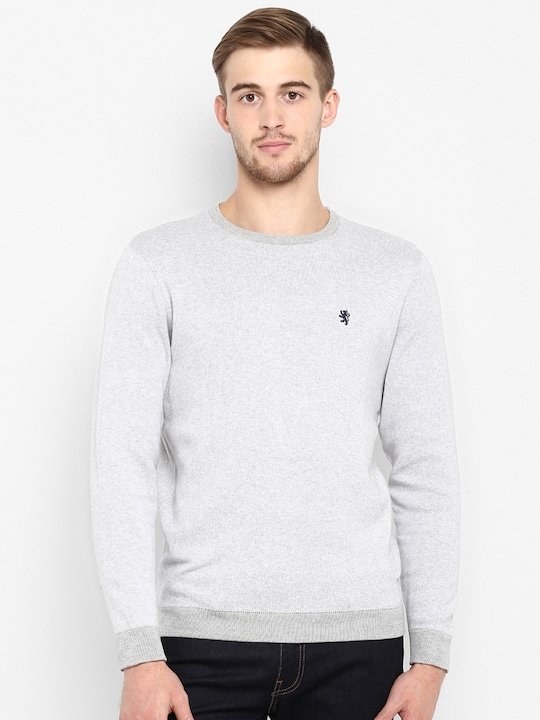



Predicted Category = sweatshirts
Predicted Attribute_1 = grey
Predicted Attribute_2 = regular


In [61]:
prediction_random()

,path,category,attribute_1,attribute_2
1279,imgs/women/101.jpg,Kurtas,NaN,Calf Length


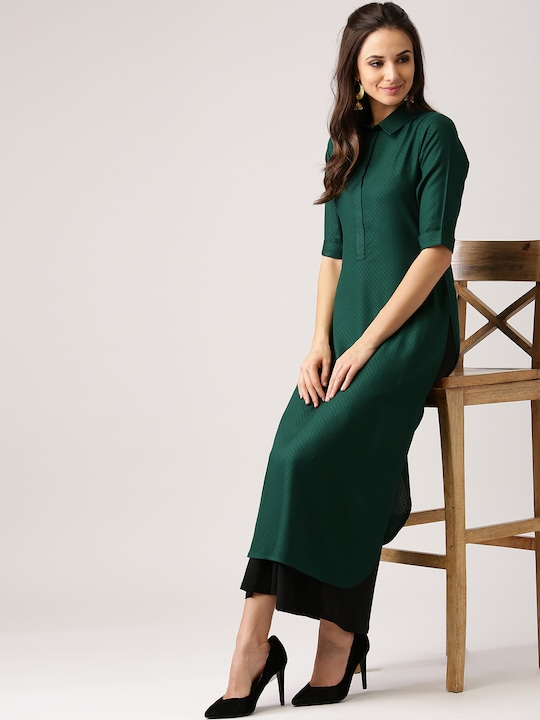



Predicted Category = kurtas
Predicted Attribute_1 = green, olive
Predicted Attribute_2 = calf_length


In [81]:
prediction_random()

,path,category,attribute_1,attribute_2
60,imgs/women/50.jpg,Sweatshirts,blue,NaN


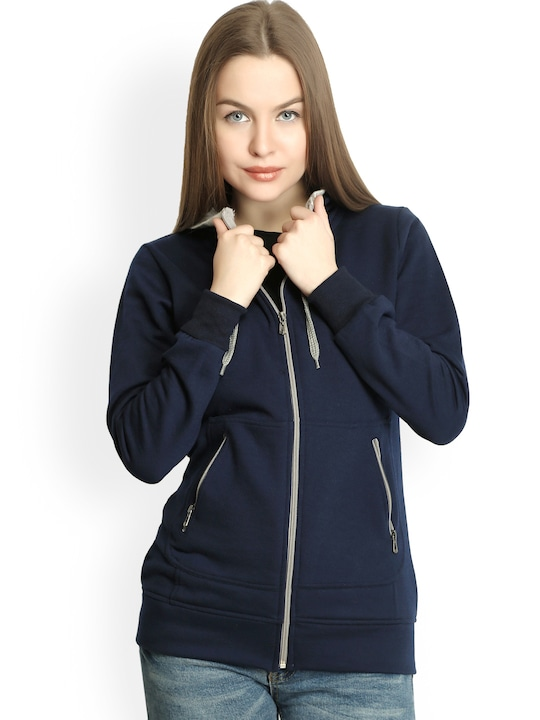



Predicted Category = sweatshirts
Predicted Attribute_1 = black
Predicted Attribute_2 = regular


In [64]:
prediction_random()

,path,category,attribute_1,attribute_2
2074,imgs/men/3520.jpg,Track Pants,NaN,Regular


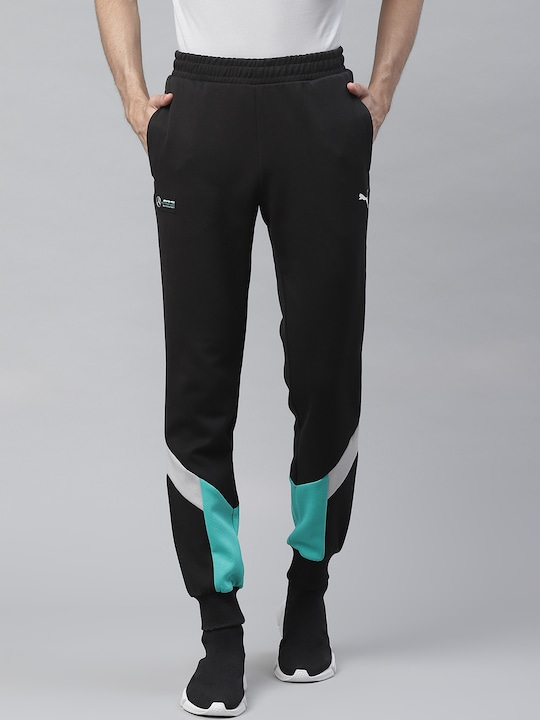



Predicted Category = track_pants
Predicted Attribute_1 = black
Predicted Attribute_2 = regular


In [65]:
prediction_random()

,path,category,attribute_1,attribute_2
1887,imgs/men/1467.jpg,Sweaters,grey,NaN


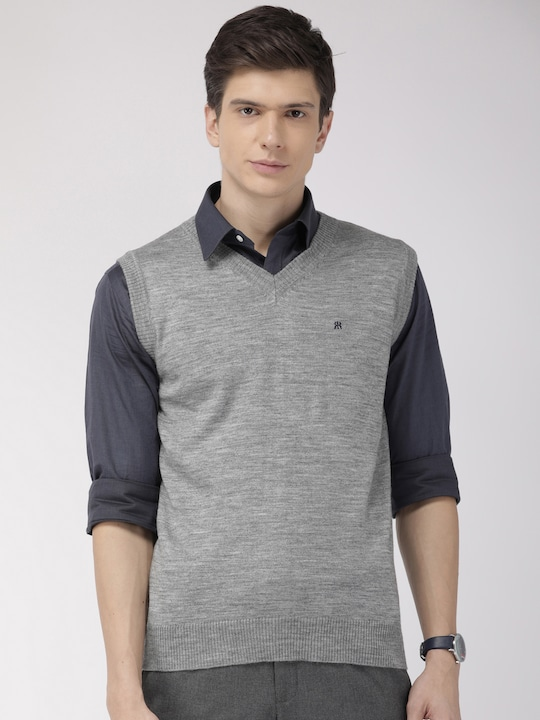



Predicted Category = sweatshirts
Predicted Attribute_1 = grey
Predicted Attribute_2 = regular


In [71]:
prediction_random()

,path,category,attribute_1,attribute_2
984,imgs/women/1024.jpg,Coats,NaN,Regular


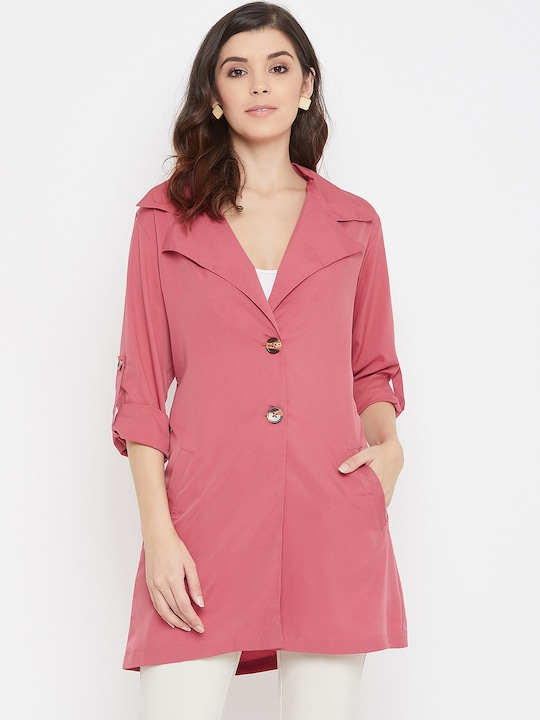



Predicted Category = coats
Predicted Attribute_1 = blue
Predicted Attribute_2 = above_knee


In [74]:
prediction_random()

,path,category,attribute_1,attribute_2
1825,imgs/men/3210.jpg,Sweatshirts,NaN,Regular


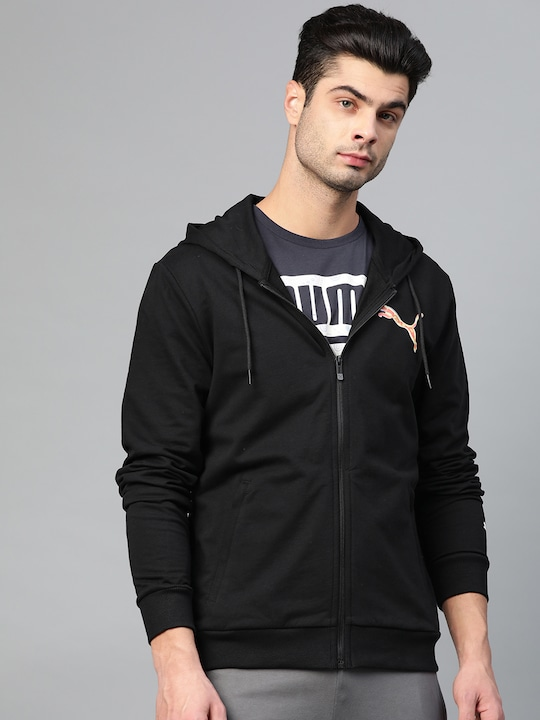



Predicted Category = sweatshirts
Predicted Attribute_1 = black
Predicted Attribute_2 = regular


In [75]:
prediction_random()

,path,category,attribute_1,attribute_2
1622,imgs/men/97.jpg,Tshirts,NaN,Regular


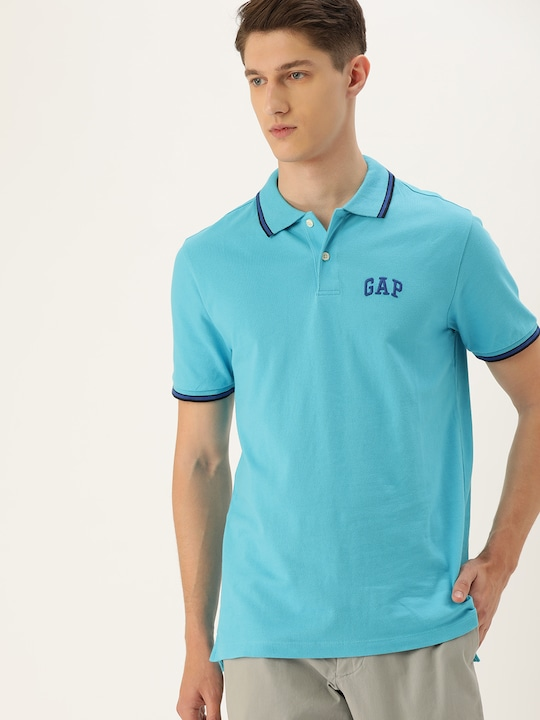



Predicted Category = tshirts
Predicted Attribute_1 = yellow
Predicted Attribute_2 = regular


In [69]:
prediction_random()

,path,category,attribute_1,attribute_2
1112,imgs/women/2966.jpg,Sweaters,"yellow, navy, blue",NaN


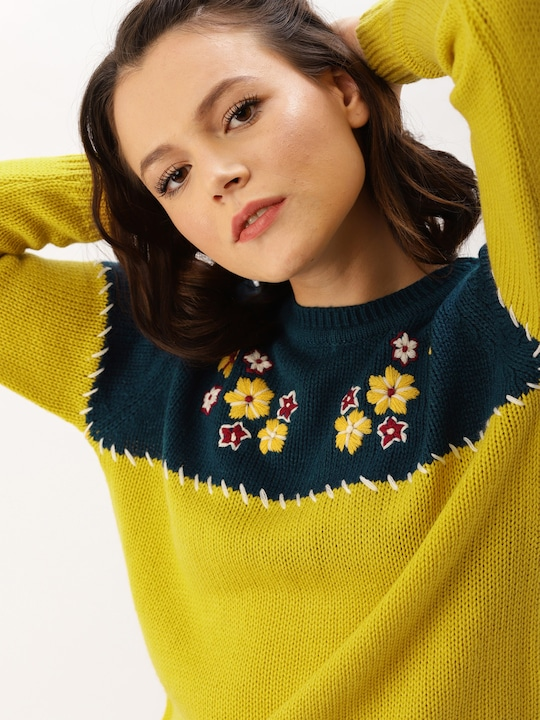



Predicted Category = sweatshirts
Predicted Attribute_1 = blue
Predicted Attribute_2 = regular


In [78]:
prediction_random()

### Not-so Good predictions

,path,category,attribute_1,attribute_2
2053,imgs/men/2810.jpg,Briefs,NaN,NaN


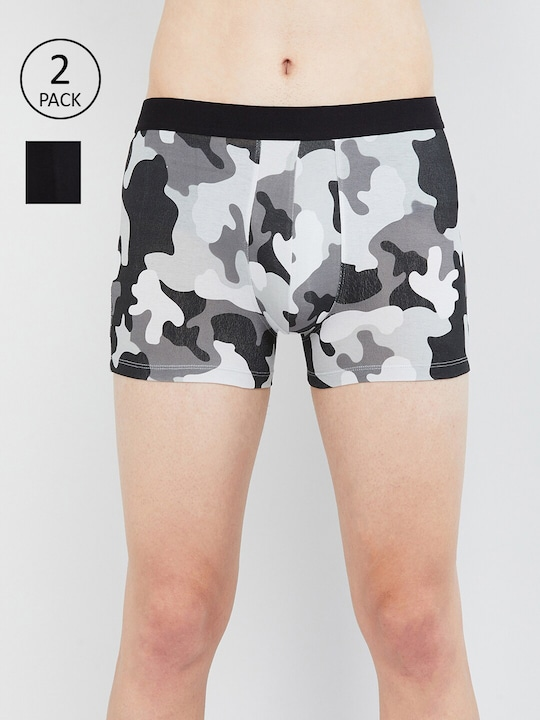



Predicted Category = sweatshirts
Predicted Attribute_1 = white
Predicted Attribute_2 = regular


In [76]:
prediction_random()

,path,category,attribute_1,attribute_2
677,imgs/men/1113.jpg,Lounge Shorts,grey,NaN


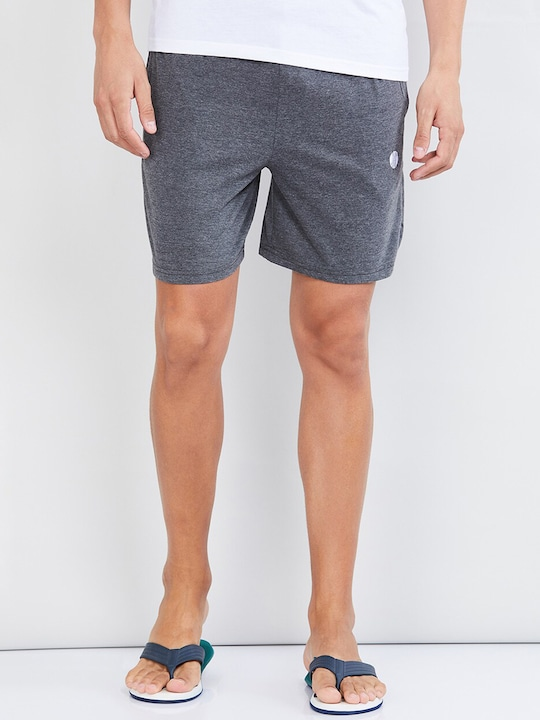



Predicted Category = kurtas
Predicted Attribute_1 = blue
Predicted Attribute_2 = regular


In [80]:
prediction_random()

,path,category,attribute_1,attribute_2
379,imgs/women/2943.jpg,Kurtis,"red, white",NaN


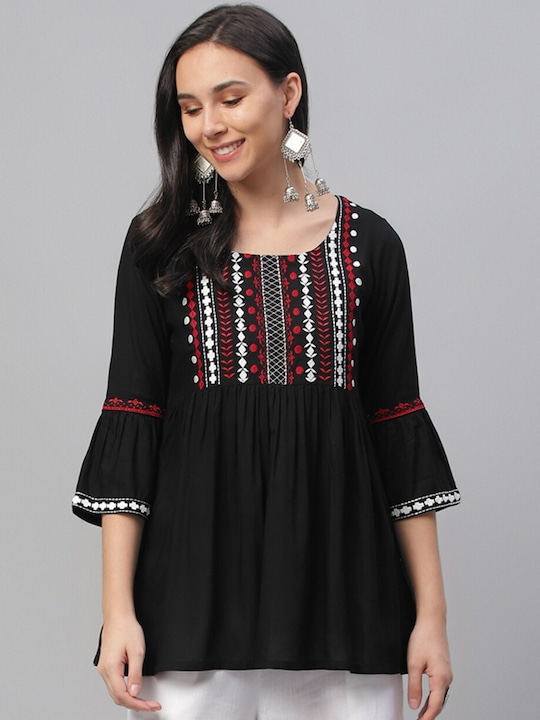



Predicted Category = sweatshirts
Predicted Attribute_1 = blue, navy
Predicted Attribute_2 = regular


In [87]:
prediction_random()

## Room for improvements:

- The model architecture is fairly simple, and not much experimented, better performance can be achieved with slightly complex model.
- The dataset is too small for good performance. Due to time constraints, I could gather only 7-8k images. With a large dataset, the performance can be improved significantly.
- The model seems to be struggling with color. Also, it considers most of the sweaters as sweatshirts. With more data, these problems could be eliminated. These could also be removed by using object localization and then detecting the color from the localized image, which would perform better.
